In [1]:
import os
import numpy as np
import mne
import matplotlib.pyplot as plt  
#%matplotlib notebook     # -- uncomment for interactive data analysis
# This interactive notebook requires MNE-python, 
# papermill (if attempted to run all the preprocessing files in one notebook)
# mayavi2 (for cortical surface source mapping 3D rendering)

## CogSci C127 Fall 2019 Final Project:
# **Data Analysis on Human Auditory and Visual Rhythms Preception**
- Shizhe Zeng

# 1. Introduction
In this Jupyter notebook, I will be analyzing a set of EEG data collected on 10 healthy volunteers. The final processed data will help identify how the human visual and auditory system can detect rhythm, synchronize with other brain areas, and establish a system to maintain an accurate timing process.


### 1.1 Background and Significance:
- The data is available on OpenNEURO, provided by Daniel C Comstock and Ramesh Balasubramaniam [1]. It contains 18 participants, and MatLab code for preprocessing, time/freq computation, frequency band extraction, statistics, and EEGLAB Cluster formation. But for the purpose of this analysis and to better understand EEG data processing and analysis. I used MNE-Python and visualize the entire experimental procedure starting from raw data. 
- The experiment presents a very exciting opportunity for researchers to better understand the underlying computational mechanisms of how the human brain recognizes external temporal signal repetition and how, possibly, multiple cognitive systems sync with each other to actively keep track of the temporal information with accuracy.
- The paper *Sensorimotor Synchronization With Auditory and Visual Modalities: Behavioral and Neural Differences* [2] uses the data to explore the different sensorimotor synchronization (SMS) pathway of the auditory system and visual system. They propose that the disparity between auditory and visual timing mechanisms likely relates to differences in processing specialization of the two perceptual modalities. And this could potentially explain the phenomenon that the auditory system is better suited to guide temporally precise behaviors such as rhythms tracking. 
- However, the original paper lacks intuitive visualization and dives deep into referencing previous publications to explore the origin and current development of sensorimotor synchronization. In the following notebook cells, I will process the raw data and visualize the underlying neural synchronization and signal propagation when the brain is perceiving and likely actively maintaining the stimulus rhythms. And in conclusion, I will present a few hypotheses on the timing mechanism function based on the processed data.

### 1.2 Experiment and Data
The experimental procedure:
- Within an hour, each participant will listen to several short duration of fixed 100bpm stimuli. Some participants will be exposed to a short 1000Hz sound tone in the first half of the time followed by a short flash of white square displayed on a screen. Others will receive the same kind of rhythmic stimuli but with the opposite order. Participants are told to notice the rhythms. There are short rests between each train of stimuli and within each train, there are few random omissions that are further apart and are assumed to not affect the overall rhythm (100bpm = 1.67Hz, imaging a relatively slow drum track). 

The files (ds002218-2.0.0 with my code added):
- The data is easily downloadable on OpenNEURO, containing: *Files: 133, Size: 1.95GB, Subjects: 18, Session: 1* 
 - 56.5 mins of EEG recording, 265Hz, n_time = 809799
- The file follows BIDS layout and also include the visual and auditory stimuli used.
- I moved the original .m data analysis file from *./code* to .*/code/old*
- I added my notebook file to *./code* , including 
 - 10x preprocess_simplify1.ipynb (1 to 10); 
 - 10x epoch_analysis1.ipynb (from 1 to 10); 
 - 1x  C127_DataAnalysisProject_ShizheZeng.ipynb;
 - various processed evoked data file, such as: *sub-001_VO_evoked-ave.fif* ( [001 ~ 010]  x  [VO,VS,AO,AS] ) 

# 2. Individual Subject Data Analysis:
## 2.1 Preprocessing:
To make the main notebook concise and to the point, all 10 subjects' raw data are loaded and processed in **separate Jupyter notebook**. This is not only easy to debug and read but also useful for further detailed analysis. When we need to make changes to the preprocessing steps or check on the individual subject's EEG signal, we only need to modify one file and run the subsequent files as they were, modular and efficient.

As mentioned previously, each subject's folder contains 1 session of a approximately 3163.28 sec AntNeuro 32 channels EEG cap.[4]. The raw EEG file was stored as a EEGLAB *.set* file. 
- Each subject is preprocessed independently from a notebook
 - For exampl: *sub-001_task-Experiment_eeg.set* is loaded to *preprocess_simplify1.ipynb*
  - then the saved file is stored in *./code/sub-001_eeg_processed_raw.fif*
   - this file is later registered with event data in *epoch_analysis1.ipynb* and output:
     - *sub-001_AO_evoked-ave.fif*   *sub-001_AS_evoked-ave.fif* 
     - *sub-001_VO_evoked-ave.fif*   *sub-001_VS_evoked-ave.fif*

The following code cells briefly explain the steps that go into removing the noise from the raw data for later event processing.
### Here we take sub-009 for example:
 - (one reason is that sub-009 has very clean data and prominent evoked data and interesting ICA identifiable artifacts)

### 2.1.1 Filtering Drift and Noise

In [9]:
# define root folder:
current_folder = os.getcwd()
root_folder = os.path.dirname(current_folder)
# select subjects:
subject = 'sub-009'
raw_file = os.path.join(root_folder,subject,'eeg', subject+'_task-Experiment_eeg.set')
# original raw file for easy comparison: 
orig_raw = mne.io.read_raw_eeglab(raw_file)
raw = mne.io.read_raw_eeglab(raw_file)
raw.load_data()  # preload data 
mne.set_log_level('WARNING')   # avoid info flood the cell

Reading C:\Users\Shizhe\brain_data\AudVisRhythm\data\sub-009\eeg\sub-009_task-Experiment_eeg.fdt
Reading C:\Users\Shizhe\brain_data\AudVisRhythm\data\sub-009\eeg\sub-009_task-Experiment_eeg.fdt
Reading 0 ... 803572  =      0.000 ...  3138.953 secs...


In [10]:
# here we apply a high-pass filter of > 1hz and low-pass filter of <55Hz to remove low-frequency drift 
# caused by head movements, power supply changes, electrode lossen, etc.
raw = raw.filter(l_freq=1, h_freq=55) 
# by plotting the original raw data on a power specturm density graph we can see very high strength in 60Hz 
# the electric powersupply ocilation frequency in US, a notch_filter solves it.
raw = raw.notch_filter(freqs=60)

### 2.1.2 ICA to Remove EOG and ECG Artifacts
Many new brain data collecting equipment come with heat beat monitor electrodes and some systems incorporate eye movement tracking. But unfortunately, this data set, although relatively new (2018) doesn't contain any further information so we have to rely on ICA and careful observation (and some trial and error to tweak seed value) to separate components that hopefully contain much more noise than signal.
- Two common noise in EEG data is the Ocular artifacts and Heartbeat artifacts. 
- The following graphs show some common features of these two in sub-009:

In [ ]:
%matplotlib notebook
from mne.preprocessing import (ICA, create_eog_epochs, create_ecg_epochs, corrmap)
# set up and fit the ICA
ica = ICA(n_components=20, random_state=97, max_iter=800)
ica.fit(raw)

<IPython.core.display.Javascript object>


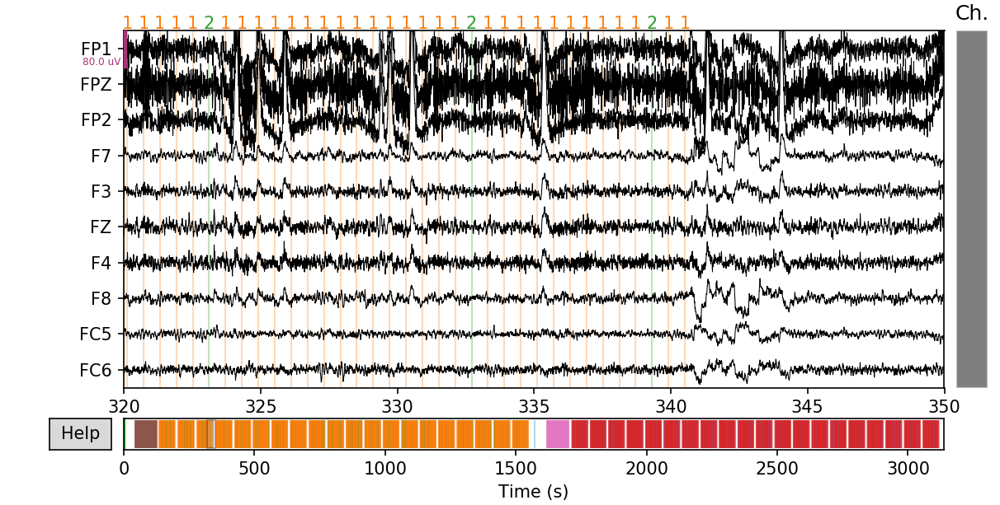

<IPython.core.display.Javascript object>


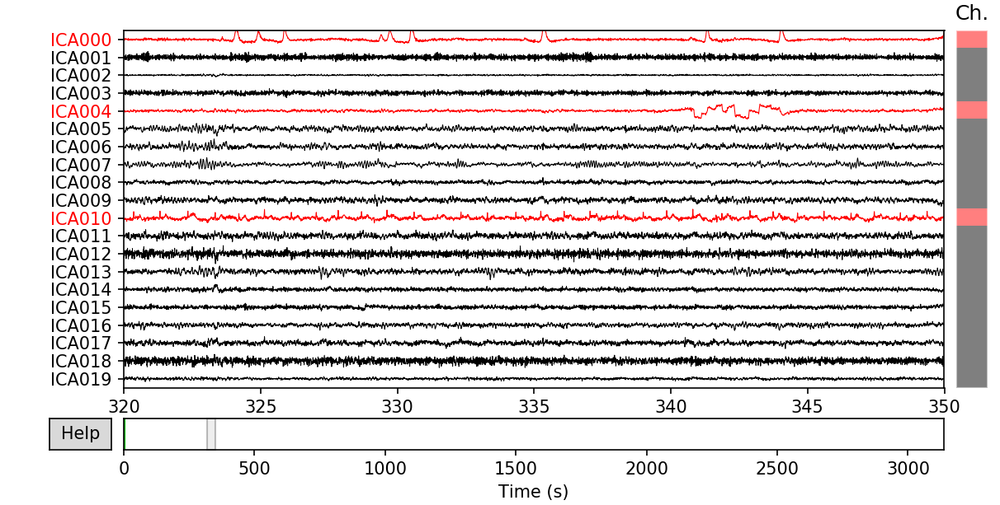

In [14]:
# Known channels with clear Ocular artifacts with some comparison:
regexp = 'FP.|F7|F8|F3|F4|FZ|FC5|FC6'
artifact_picks = mne.pick_channels_regexp(raw.ch_names, regexp=regexp)
raw.plot(duration=30, start=320, scalings=dict(eeg=2*20e-6),order=artifact_picks, n_channels=len(artifact_picks));
# since we known the bad channels from preprocessing notebook file 
# the excluded channel is displayed here for intuitive viewing:
ica.exclude = [0,4,10]
# for easy scrutiny of data in matplotlib inline mode
ica_time = 320
ica.plot_sources(raw, start=ica_time, stop=ica_time+30);  # raw);

<IPython.core.display.Javascript object>


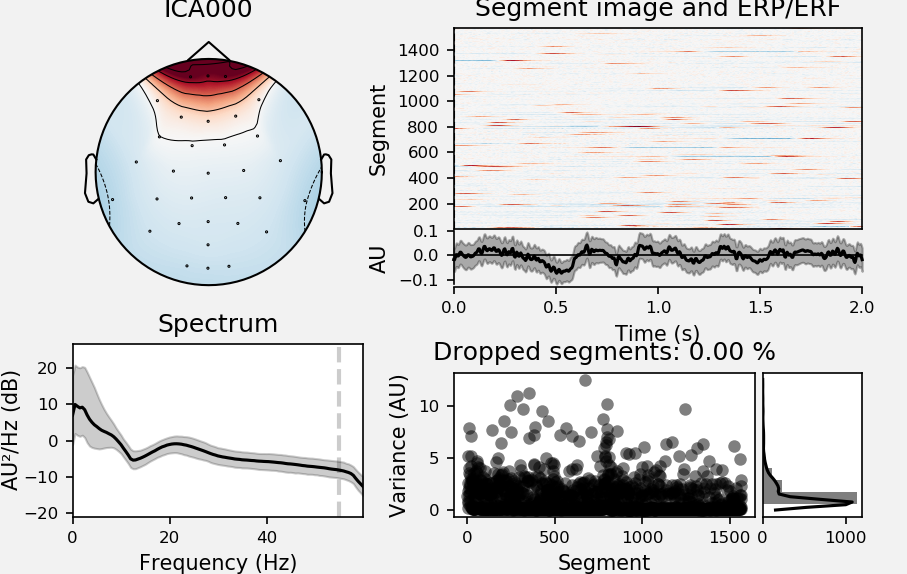

<IPython.core.display.Javascript object>


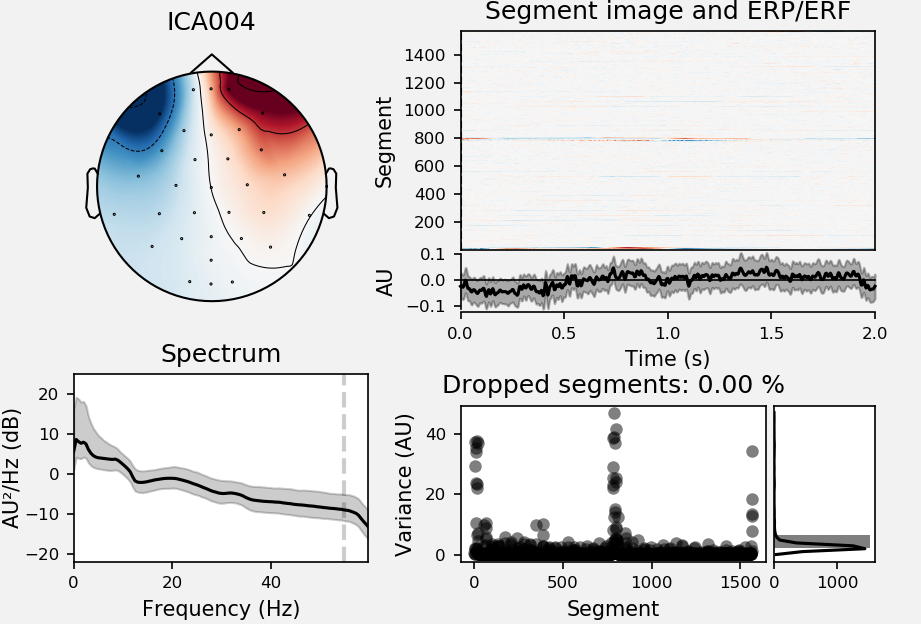

<IPython.core.display.Javascript object>


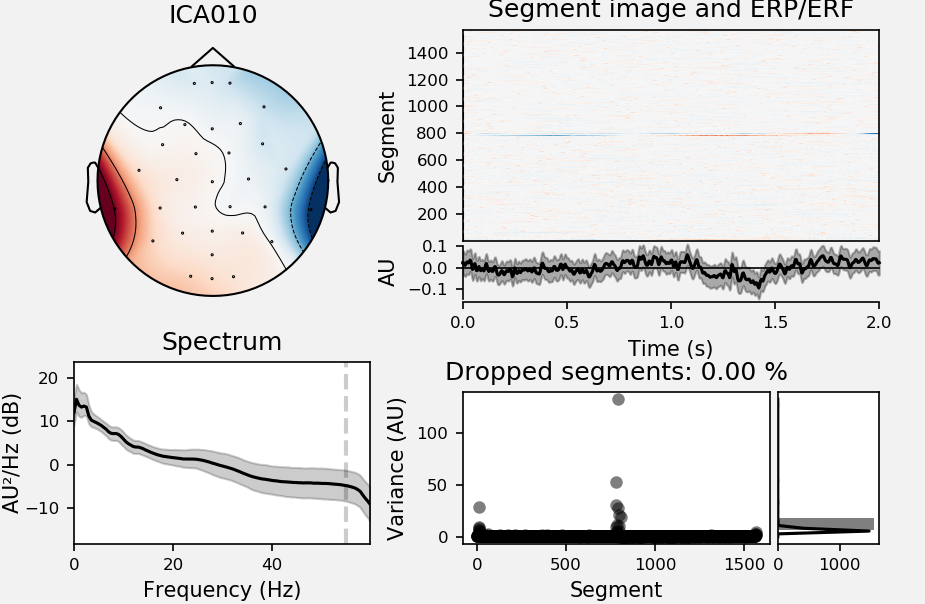

In [16]:
ica.plot_properties(raw, picks=[0,4,10],psd_args=dict(fmax=60));

Independent Component Analysis (ICA) is often to preprocessing EEG data because of its great ability to filter out artifacts from the signal.[5]
- contrary to Principle Component Analysis (PCA), ICA finds the components that have the least covariance to each other and it is great at picking artifact such as vertical/horizontal eye movement, eye blinks, muscle triggers, gradients of heat, power line and electric outlets noise and bad channel noise.[6] 
- There are many ways to optimize the ICA obtained. Many common signal processing software uses to fit the same amount of components as a low-end EEG cap, which is 24 channels = 24 components. For this subject, I used 20 components and relatively high iteration time. The seed is fixed for consistency across the different run.
- For best practice, unless we can confidently reject the Null-hypothesis, we should remove as little components as possible since we could also be removing the data rather than noise.

However, shown above are 3 components that are very identifiable as artifacts. 
- **ICA000** : This component captures the effects of eye blinks. This is also easily confirmed by the high correlation between the time-series of ICA000 and the electrodes close to the eye (FP1, FPZ, FP2). For all eye components, the power spectrum will vary due to experiments and people, but generally, most of the power will reside at frequencies< 5 Hz. Brain activity is usually around 10Hz in the resting state (as the subject sitting while listening to the rhythm. )

- **ICA004** : Each retina (the part of the eye that registers incoming light) creates an electric field that can be effectively modeled as an "equivalent current dipole" (ECD). Typically, eye motion is split into two components: vertical movement and horizontal movement. This component captures the effects of horizontal eye movement. 

- **ICA010** : This component captures the effect of the heartbeat. Shown in the component time series, it has a very visible regular spiking pattern at about 1Hz and it has a relatively smooth power spectrum except at 1Hz.[6]

<IPython.core.display.Javascript object>


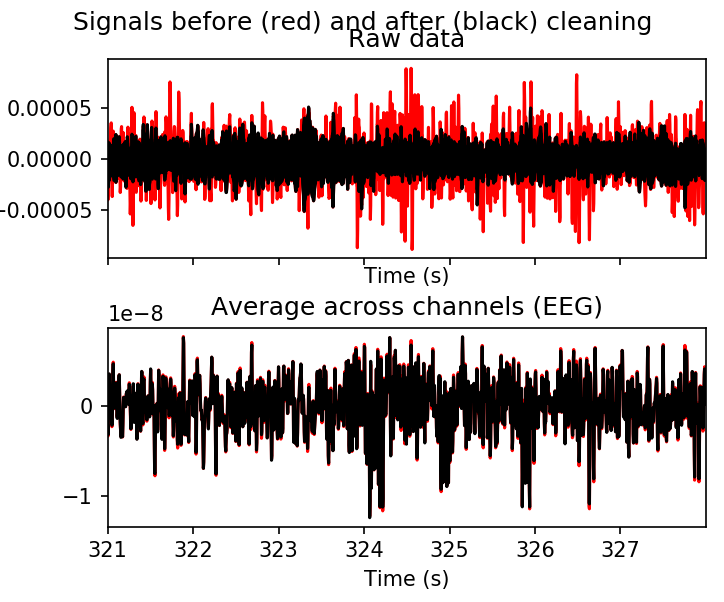

In [19]:
# blinks
plot_start = 321
ica.plot_overlay(raw, exclude=[0,1], start=plot_start*256, stop=(plot_start+7)*256);
raw.load_data()
ica.apply(raw)
raw.save(subject+'_eeg_processed_raw.fif');

In [ ]:
del current_folder, root_folder, subject, raw_file, orig_raw, raw; # to save memory
del regexp, ica, ica_time

> This marks the end of this block. Similarly the end of most of the *preprocess_simplify1.ipynb* files. 
> <br> **However**, each *preprocess_simplify.ipynb* will save the data in *./data/code*

## 2.2 Analysis Experimental Events
Since one can always look for more detailed tutorial and API documentation on MNE, this part of the analysis has little annotation. We continue with the following processes:
 - Detecting experimental events
 - Annotate the events for easy paring 
 - Epoching continuous data 
 - Estimating evoked responses
 

<IPython.core.display.Javascript object>


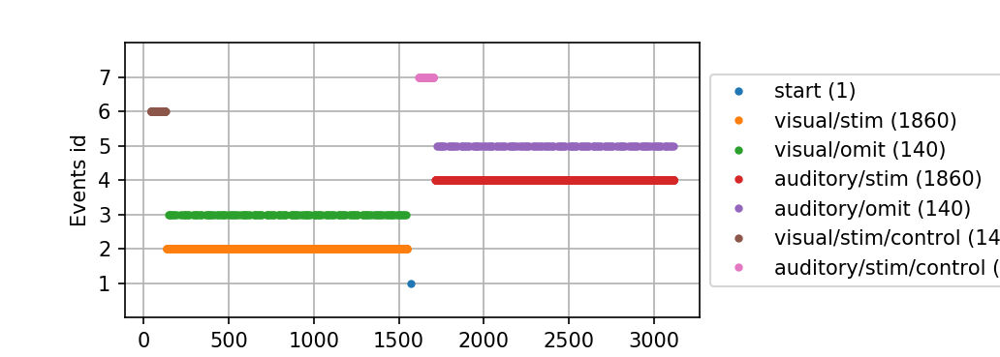

In [21]:
from mne.event import define_target_events
from mne.channels import make_1020_channel_selections
# similar code  as all other epoch_analysis*.ipynb  :
current_folder = os.getcwd()
subject = 'sub-009'
raw_file = os.path.join(current_folder, subject+'_eeg_processed_raw.fif')
raw = mne.io.read_raw_fif(raw_file)
raw.load_data()
# get the event:
events = mne.events_from_annotations(raw)[0]
# a = 0
# print(events[a:a+5])   # show the first 5; used to manually inspect the events
event_dict = {'auditory/stim': 4, 'auditory/omit': 5, 
              'visual/stim': 2, 'visual/omit': 3, 
              'visual/stim/control': 6, 'auditory/stim/control': 7 , 'start': 1}
fig = mne.viz.plot_events(events, event_id=event_dict, sfreq=raw.info['sfreq'])
fig.subplots_adjust(right=0.7)  # make room for the legend

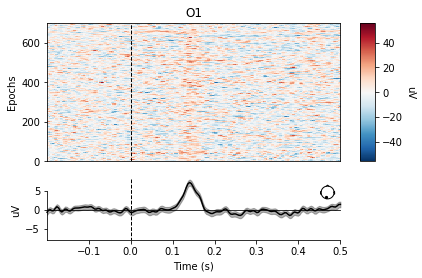

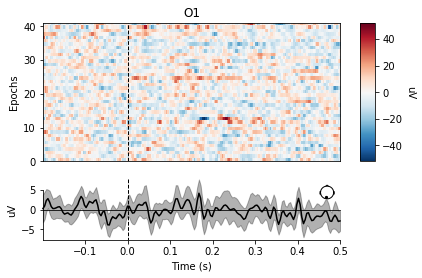

In [24]:
# Epoching continuous data
reject_criteria = dict(eeg=150e-6)  # 150 μV  different for each subject for best rejection
# rejects about half the data for each events
epochs = mne.Epochs(raw, events, event_id=event_dict, tmin=-0.2, tmax=0.5,
                    reject=reject_criteria, preload=True)
# equalize event count to reduce bias
epochs.equalize_event_counts(['auditory/stim','visual/stim'])  # this operates in-place
epochs.equalize_event_counts(['auditory/omit','visual/omit']);
#  events we are interested
aud_stim_epochs = epochs['auditory/stim']
vid_stim_epochs = epochs['visual/stim']
auditory_omit_epochs = epochs['auditory/omit']
visual_omit_epochs = epochs['visual/omit']
%matplotlib inline
# aud_stim_epochs.plot_image(picks=['T7']) #,scalings=dict(eeg=0.5*1e6))
# auditory_omit_epochs.plot_image(picks=['T7']);
vid_stim_epochs.plot_image(picks=['O1'])
visual_omit_epochs.plot_image(picks=['O1']);

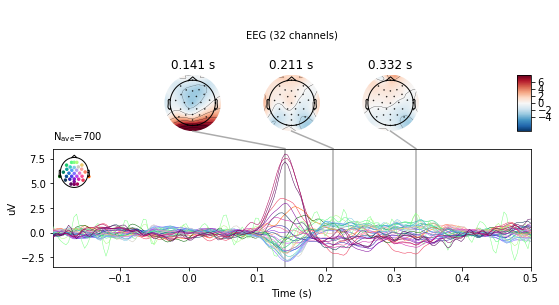

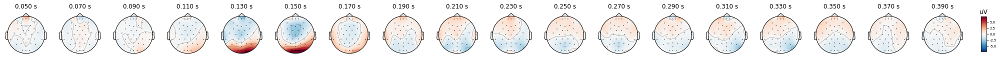

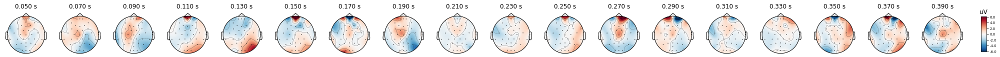

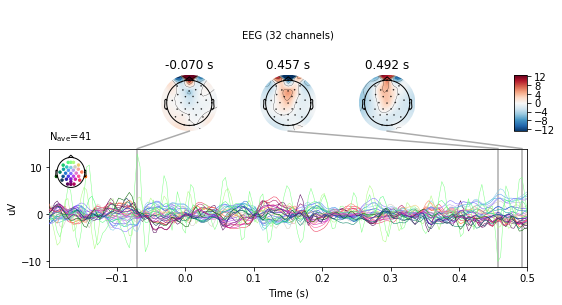

In [25]:
# Estimating evoked responses
aud_stim_epochs = epochs['auditory/stim']
vid_stim_epochs = epochs['visual/stim']
auditory_omit_epochs = epochs['auditory/omit']
visual_omit_epochs = epochs['visual/omit']
# average epochs
aud_stim_evoked = aud_stim_epochs.average()
vis_stim_evoked = vid_stim_epochs.average()
aud_omit_evoked = auditory_omit_epochs.average()
vis_omit_evoked = visual_omit_epochs.average()
# playing tone at 100bpm
# here we plot the evoked responses of visual rhythm preception and ommitted flash suprise
times = np.arange(0.05, 0.401, 0.02)
vis_stim_evoked.plot_joint()
vis_stim_evoked.plot_topomap(times)
vis_omit_evoked.plot_topomap(times);
vis_omit_evoked.plot_joint();

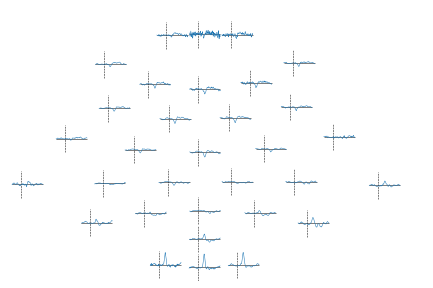

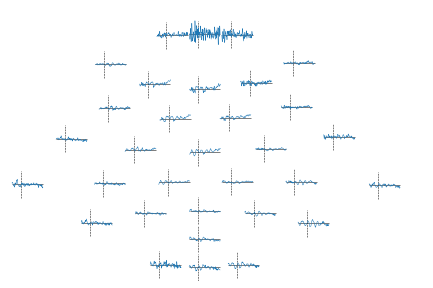

In [26]:
vis_stim_evoked.plot_topo(legend=False);
vis_omit_evoked.plot_topo(legend=False);

## 2.3 Individual Subject Analysis
### Here we can attempt to answer some of the questions we have at the beginning of the data analysis:
- How does the human visual and auditory system respond to rhythmic stimuli?
- How do the two systems respond to an omitted stimuli when they are respectively actively expecting a timed stimulus?
  - OR phrase it: how do the two systems respond to a "surprise" in a state of sensorimotor synchronization
  
  
- Although the data for each subject are not particularly great, and we only have 32 channels to work with (some of them have long duration of drift and artifact not removed by automatic low-pass uV filtering on event epochs), we can clearly see the dominant effect of C1 in the primary visual area when there is a flash presented. C1 is an ERP component typically summed in P1 wave, it is called so because it can be both positive ERP (P100) or negative (N100+) depending on the visual stimuli and where it corresponds to the cortical surface.[7] When the lower visual field is encoding, the upper back of the fissure produces the strongest signal and the positive side of the dipole points to it (upward) and produces a positive signal on EEG. when the upper part of the visual field is being encoded, it is the opposite and the dipole points to the surface on the bottom, and consequently produces a negative signal. Possibly, here the subject is lying on a chair and the screen flash is primarily registered on his/her lower V1 and thus cause minimal N100 ERP.[8]

- from the topographical map with the evoked signal, we can see the electrodes away from V1 have slightly delayed P100, indicating the signal is rapidly propagating away from the V1.

- Interestingly, in the flash omitted event evoked topographic map we see rather strong high-frequency potential changes in the Prefrontal cortex. So the 'expectation' of a stimulus coming based on perceived rhythm likely involves prefrontal cortex coordination and planning. As mentioned in, the timing system likely varying mechanisms to measure and register a precise time scale. And in pacemaker accumulator models, multiple oscillator models, and memory trace models, the prefrontal cortex could play an important roll in facilitating working memory to establish the timing system.[2]

- Though, Sub-004's evoked ERP signal is significant for both visual stimuli and auditory stimuli and have possible explainable ERP for omitted events. More subjects need to see if similar ERP exist across individuals.

- With the EEG system, one of the more useful and consistent data we acquire in experiments is Event-Related Potential (ERP). By summing up enough trials, we can comfortably eliminate most of the noise that is not related to the onset of the event, giving ERP a good signal to noise ratio. Here, for subject-009, even over 2000 trial is rejected, we still have half of the data to average, thus producing a rater clean evoked plot. Remember, this experiment has a duration of 56 minutes, so we expect a lot of the data are useless because of the subject not paying attention to the task or moving because they are bored of the monotone sound or flash.

- One of the central issues that must be addressed for a given ERP component is the nature of the psychological or neural processes that it reflects. Over the past decades, researches have given the conceptual definition of ERP as a phenomenon related to a particular computation. And so far, it is still a difficult issue to address.[7] 


In [ ]:
del current_folder, subject, raw_file, raw; # to save memory
del event_dict, fig

> This marks the end of this block. Similarly the end of most of the *epoch_analysis9.ipynb* files. 
> <br> **However**, each *epoch_analysis9.ipynb* will save all 4 evoked data in *./data/code* as:
   - sub-009_VO_evoked-ave.fif
   - sub-009_VS_evoked-ave.fif
   - sub-009_AO_evoked-ave.fif
   - sub-009_AS_evoked-ave.fif

# 3. Group analysis

### In order for this part to work, all the 
- 10x preprocess_simplify1.ipynb (1 to 10);
- 10x epoch_analysis1.ipynb (from 1 to 10);
### need to be run first for the evocked data for each idividual subject to be processed.

In this part, I combined 9 subjects' evoked data to gain more statistical power in order to get a more distincted ERP for the omitted events. But apart from strong 10Hz ossiliation there is still no obvious identifiable ERP for the omitted events.

However, for the stimulus events, with correct grouping and signal strength normalization, the combined data gives a clearer picture. If I have more time, I would aquire more data and see if there are ERP converging or there is still strong 10Hz signal (which indicate resting-state brain activity).

In [2]:
mne.set_log_level('WARNING')   # a str, it can be either DEBUG, INFO, WARNING, ERROR, or CRITICAL. 
current_folder = os.getcwd()
print(current_folder)

C:\Users\Shizhe\brain_data\AudVisRhythm\data\code


In [3]:
subject = 'sub-010'
raw_file = os.path.join(current_folder, subject+'_eeg_processed_raw.fif')
print(raw_file)

C:\Users\Shizhe\brain_data\AudVisRhythm\data\code\sub-010_eeg_processed_raw.fif


In [4]:
#del d;  
d={}
list = [1,2,3,4,5,6,7,8,9]
for subject in list:
    d['s-00{0}'.format(subject)]="ready"; 
    file_name = 'sub-00' + str(subject) + '_VS_evoked-ave.fif'
    d['s-00{0}_VS'.format(subject)]= mne.Evoked(file_name)
    file_name = 'sub-00' + str(subject) + '_VO_evoked-ave.fif'
    d['s-00{0}_VO'.format(subject)]= mne.Evoked(file_name)
    file_name = 'sub-00' + str(subject) + '_AS_evoked-ave.fif'
    d['s-00{0}_AS'.format(subject)]= mne.Evoked(file_name)
    file_name = 'sub-00' + str(subject) + '_AO_evoked-ave.fif'
    d['s-00{0}_AO'.format(subject)]= mne.Evoked(file_name)

In [5]:
# d   

subject3


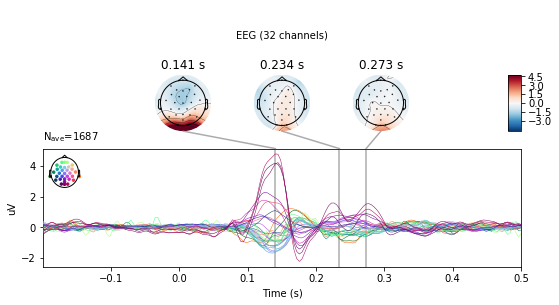

subject4


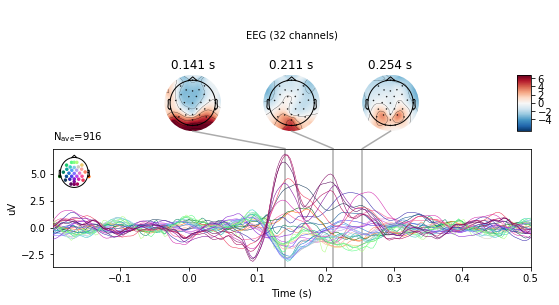

subject8


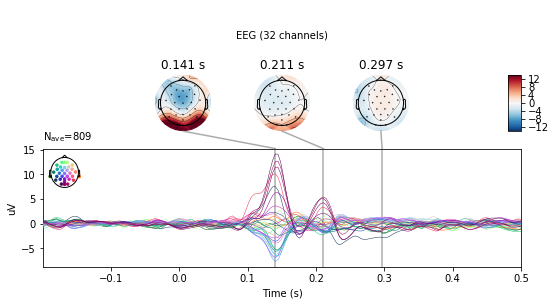

subject9


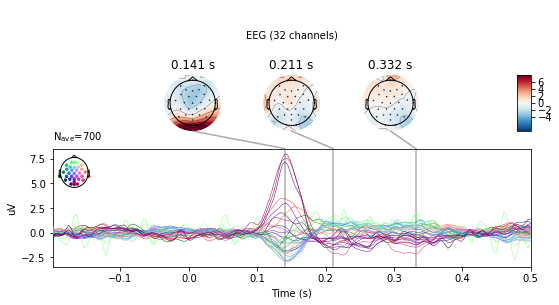

subject6


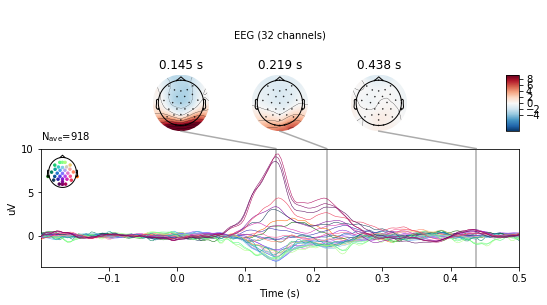

subject7


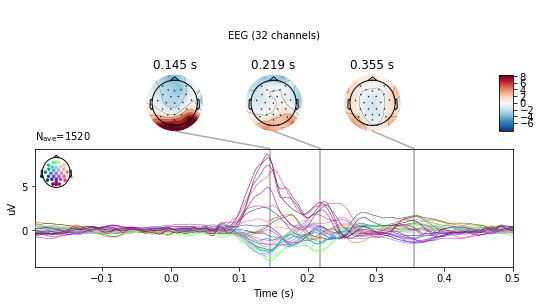

subject1


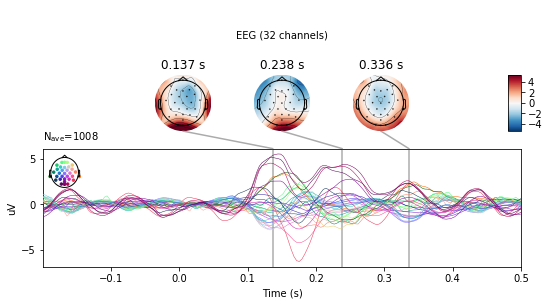

subject2


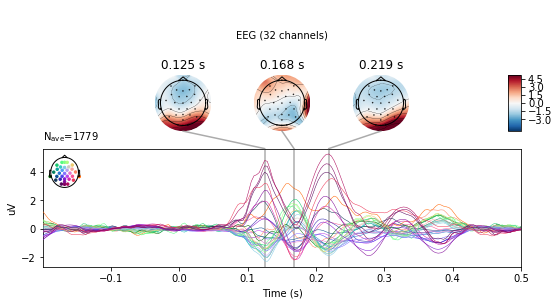

subject5


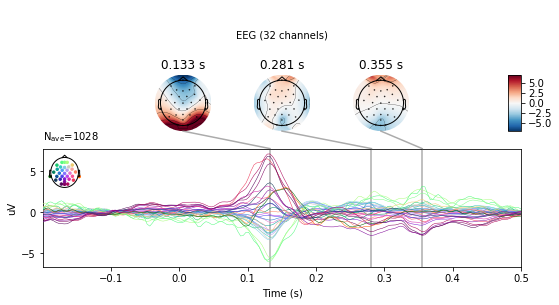

subject3


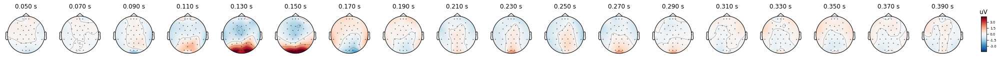

subject4


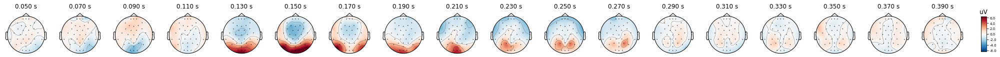

subject8


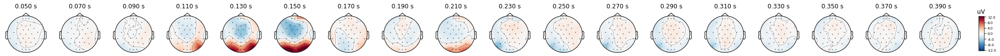

subject9


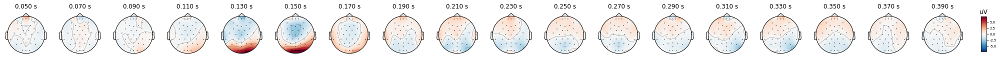

subject6


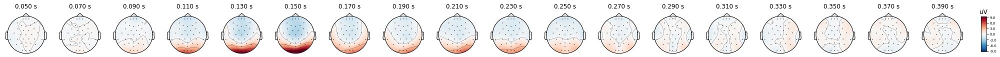

subject7


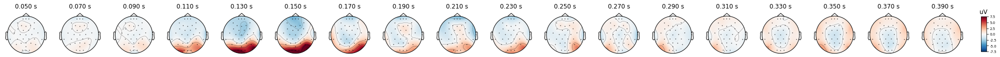

subject1


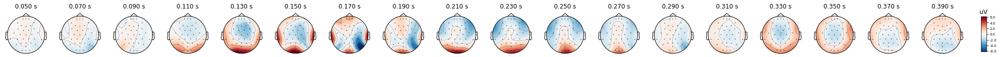

subject2


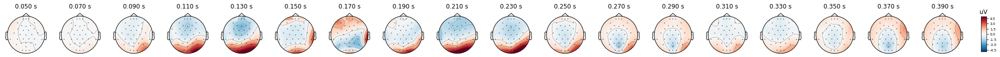

subject5


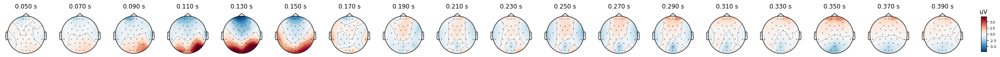

In [6]:
v_order_list = [3,4,8,9,6,7,1,2,5]
times = np.arange(0.05, 0.401, 0.02)
for subject in v_order_list :
    print('subject'+str(subject))
    d['s-00{0}_VS'.format(subject)].plot_joint();
for subject in v_order_list:
    print('subject'+str(subject))
    d['s-00{0}_VS'.format(subject)].plot_topomap(times);

subject2


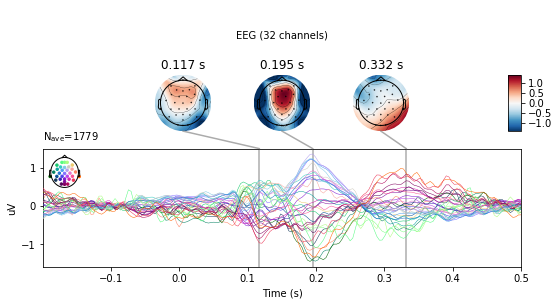

subject1


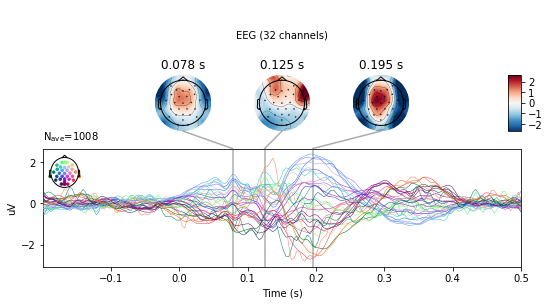

subject4


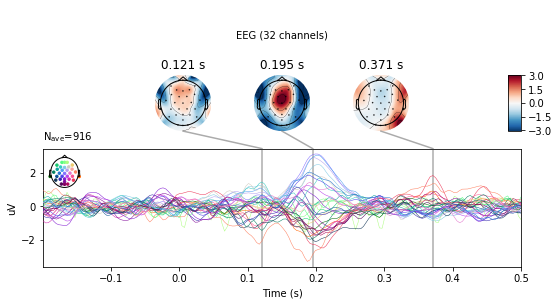

subject6


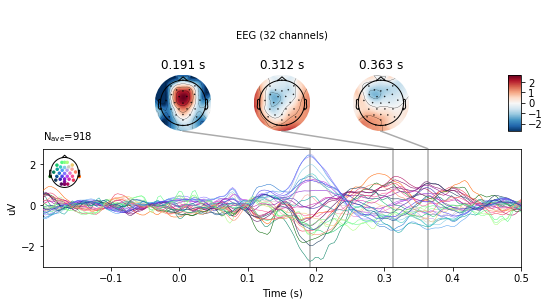

subject7


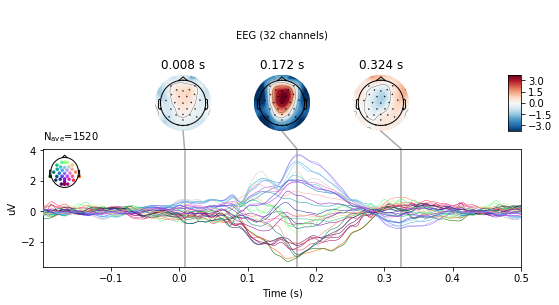

subject8


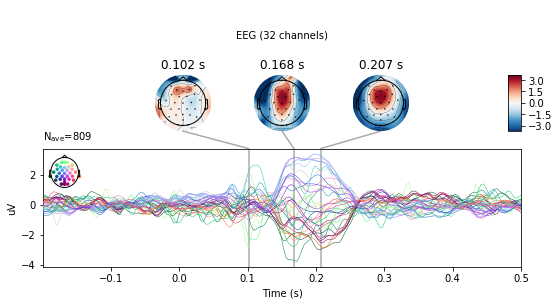

subject5


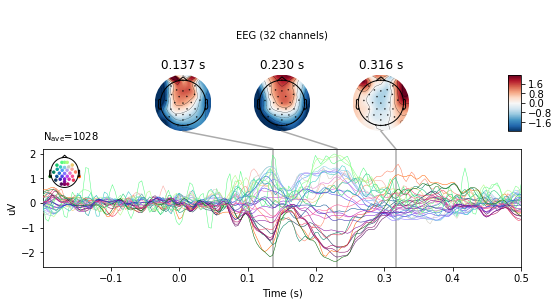

subject3


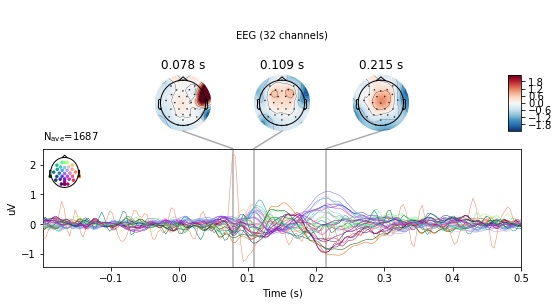

subject9


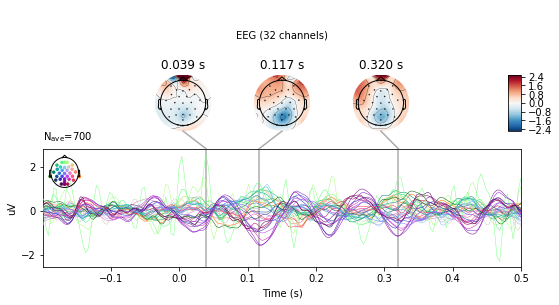

subject2


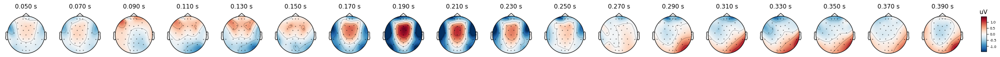

subject1


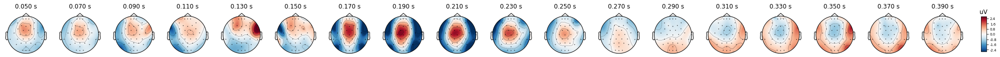

subject4


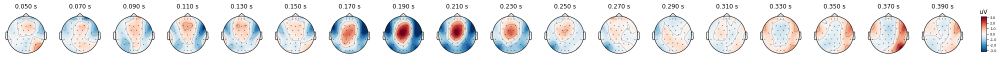

subject6


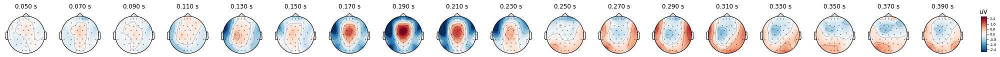

subject7


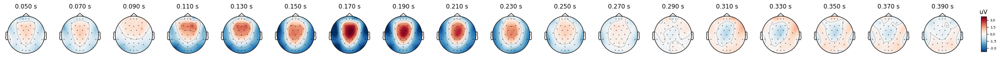

subject8


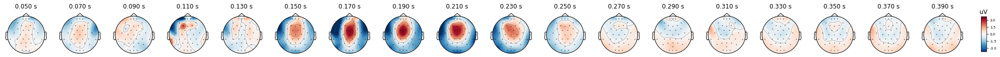

subject5


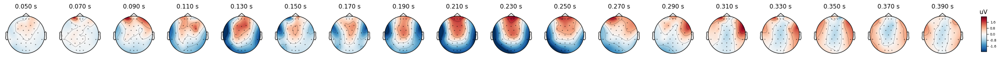

subject3


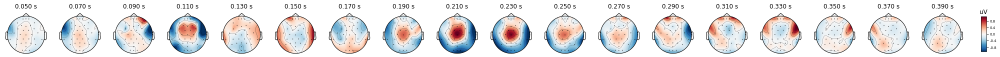

subject9


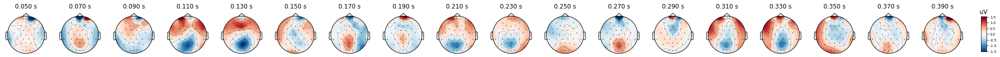

In [7]:
A_order_list = [2,1,4,6,7,8,5,3,9]
for subject in A_order_list:
    print('subject'+str(subject))
    d['s-00{0}_AS'.format(subject)].plot_joint();
for subject in A_order_list:
    print('subject'+str(subject))
    d['s-00{0}_AS'.format(subject)].plot_topomap(times);

# 4.2 Combining indivisual data to attempt to explain rhythm perception

In [8]:
list_evoked_VO=[];  list_evoked_VS =[];  list_evoked_AO =[];  list_evoked_AS = [];
print(v_order_list)
for subject in v_order_list:
    list_evoked_VO.append(d['s-00{0}_VO'.format(subject)])
    list_evoked_VS.append(d['s-00{0}_VS'.format(subject)])
print(A_order_list)
for subject in A_order_list:
    list_evoked_AO.append(d['s-00{0}_AO'.format(subject)])
    list_evoked_AS.append(d['s-00{0}_AS'.format(subject)])

[3, 4, 8, 9, 6, 7, 1, 2, 5]
[2, 1, 4, 6, 7, 8, 5, 3, 9]


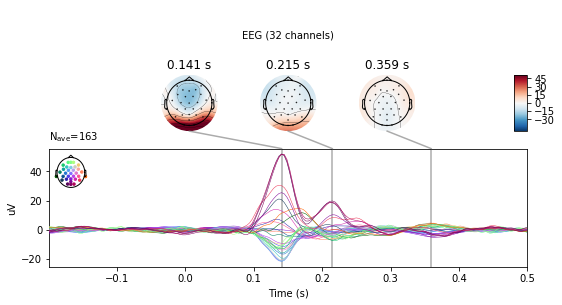

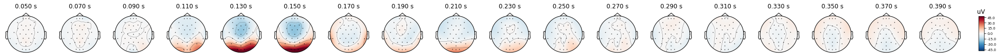

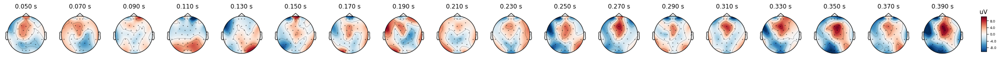

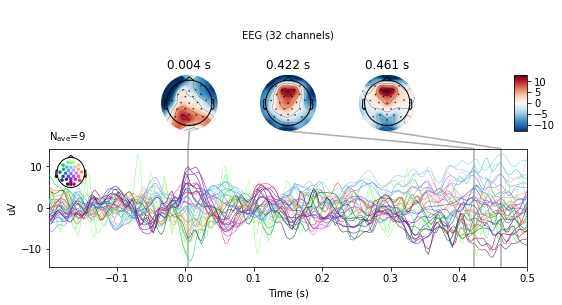

In [9]:
weights = [1,1,1,0.9,0.8,0.8,0.7,0.6,0.5]
evoked_VS_comb = mne.combine_evoked(list_evoked_VS, weights=weights)
evoked_VS_comb.plot_joint()
evoked_VS_comb.plot_topomap(times)
evoked_VO_comb = mne.combine_evoked(list_evoked_VO, weights=weights)
evoked_VO_comb.plot_topomap(times)
evoked_VO_comb.plot_joint();

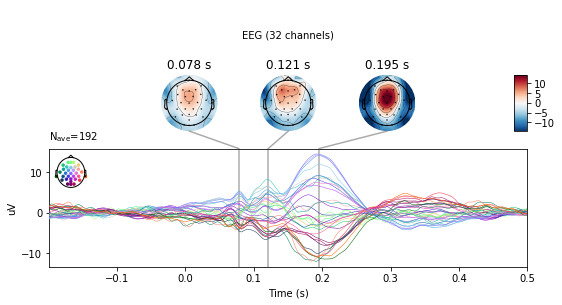

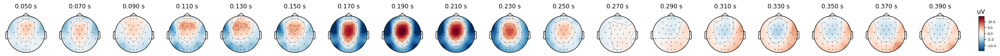

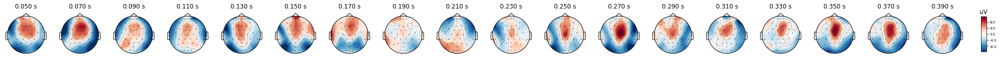

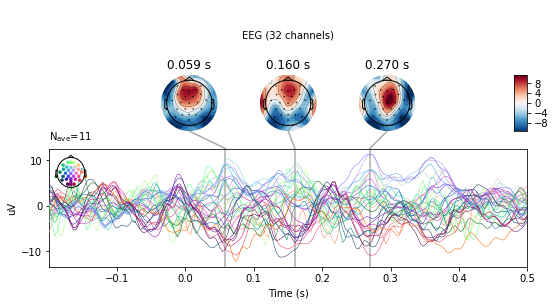

In [10]:
weights = [1,1,1,0.9,0.8,0.7,0.6,0.5,0.3]
evoked_AS_comb = mne.combine_evoked(list_evoked_AS, weights=weights)
evoked_AS_comb.plot_joint();
evoked_AS_comb.plot_topomap(times)
evoked_AO_comb = mne.combine_evoked(list_evoked_AO, weights=weights)
evoked_AO_comb.plot_topomap(times)
evoked_AO_comb.plot_joint();

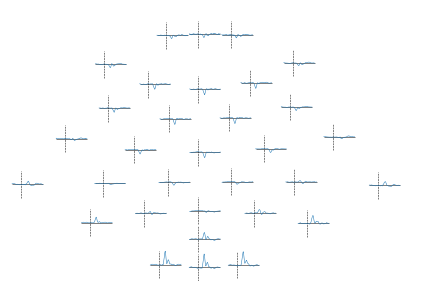

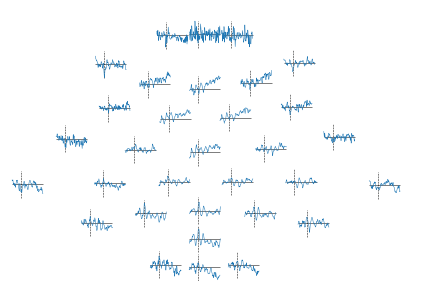

In [11]:
evoked_VS_comb.plot_topo(legend=False)
evoked_VO_comb.plot_topo(legend=False);

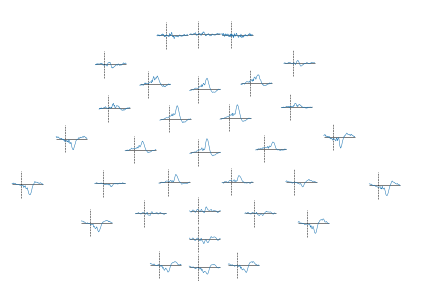

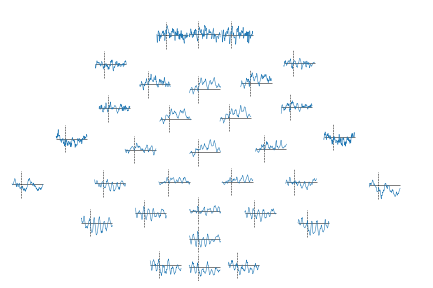

In [12]:
evoked_AS_comb.plot_topo(legend=False)
evoked_AO_comb.plot_topo(legend=False);

here

Familiarizing yourself with typical artifact patterns and magnitudes is a crucial first step in assessing the efficacy of later attempts to repair those artifacts. A good rule of thumb is that the artifact amplitudes should be orders of magnitude larger than your signal of interest — and there should be several occurrences of such events — in order to find signal decompositions that effectively estimate and repair the artifacts.

# Thank you for taking the time to read my Final Project!

3.	Data analysis: 
a.	An outline (or table of contents) of all the analyses performed. 
b.	For every analysis, 
i.	include a section title, 
ii.	restate the motivation and the question you are trying to answer with this particular analysis. 
iii.	Visualize your results with appropriate graphs or tables and explain every element in the visualization. 
iv.	Interpret the results of your analysis in the context of your research. How does it help in answering your research question?
4.	Conclusion, discussion and interpretation, 1-2 paragraphs.

## 4. Reference: 
- [1] Daniel C Comstock & Ramesh Balasubramaniam (2019), Auditory and Visual Rhythm Omission EEG, 2019-10-03 (Version 2.0.0), DOI: 10.1109/EMBC.2015.7320110 
- [2] Daniel C. Comstock, Michael J. Hove, & Ramesh Balasubramaniam1 (2018), Sensorimotor Synchronization With Auditory and Visual Modalities: Behavioral and Neural Differences   
- [3] Steven J. Luck(2014), An Introduction to the Event-Related Potential Technique, ISBN-13: 978-0262525855
- [4] ANTneuro website for head placement reference.
- [5] I. Rejer & P. Górski (2015), Benefits of ICA in the Case of a Few Channel EEG, IEEE, , DOI: 10.1109/EMBC.2015.7320110
- [6] ICLabel, ICLabel Tutorial: EEG Independent Component Labeling, accessed 2019
- [7] Geoffrey F. Woodman(2010), A Brief Introduction to the Use of Event-Related Potentials (ERPs) in Studies of Perception and Attention, Atten Percept Psychophys. 2010 Nov; doi: 10.3758/APP.72.8.2031
- [8] Shravani Sur & V. K. Sinha (2009), Event-related potential: An overview, Industrial Psychiatry Journal, doi: 10.4103/0972-6748.57865

### website access:
- [1] https://openneuro.org/datasets/ds002218/versions/2.0.0
- [2] https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6058047/
- [3] https://search.ebscohost.com/login.aspx?direct=true&db=cat04202a&AN=ucb.b22212956&site=eds-live&authtype=ip,guest&custid=s1226370&groupid=main&profile=eds
- [4] https://www.ant-neuro.com/products/waveguard/electrode-layouts
- [5] https://ieeexplore.ieee.org/document/7320110
- [6] https://labeling.ucsd.edu/tutorial/labels
- [7] https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3816929/
- [8] https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3016705/


In [ ]:
# flashing at 100bpm
vis_stim_evoked.plot_joint()
vis_stim_evoked.plot_topomap(times);
# vis_omit_evoked.plot_joint(times=[0.145,0.238,0.336]);
vis_omit_evoked.plot_topomap(times);
vis_omit_evoked.plot_joint();

In [ ]:
AudDeviButton\data\code for 3d surface source mapping

In [ ]:
# This backend requires that the ipywidgets and ipyevents packages be installed
from mayavi import mlab
mlab.init_notebook()

In [ ]:
from IPython.display import Image
output_image_path = 'C:\\Users\\Shizhe\\brain_data\\AudDeviButton\\data\code\\'
# mlab.savefig(output_image_path + 'test.png') #, magnification=mag)
# Image(filename = output_image_path + 'test.png', width=400, height=400)

In [ ]:
stc_standard = mne.minimum_norm.apply_inverse(evoked_std, inv, lambda2, 'dSPM')
brain = stc_standard.plot(subjects_dir=subjects_dir, subject=subject,
                          surface='inflated', time_viewer=False, hemi='lh',
                          initial_time=0.1, time_unit='s')
mlab.savefig(output_image_path + 'standard.png') #, magnification=mag)
Image(filename = output_image_path + 'standard.png', width=400, height=400)
#s = mlab.test_plot3d()
#s

In [ ]:
ten_twenty_montage = mne.channels.make_standard_montage('standard_1020')
ten_twenty_montage.plot(show_names=False)
fig = ten_twenty_montage.plot(kind='3d')
fig.gca().view_init(azim=70, elev=15)

In [ ]:
list_evoked_VO=[];  list_evoked_VS =[];  list_evoked_AO =[];  list_evoked_AS = [];
for subject in order_list:
    #print('subject'+str(subject))
    #d['s-00{0}_VS'.format(subject)].plot_joint();
    list_evoked_VO.append(d['s-00{0}_VS'.format(subject)])
#= [d['s-001_VO'],d['s-002_VO'],d['s-003_VO'],d['s-004_VO'],d['s-005_VO']
 #                 ,d['s-006_VO'],d['s-007_VO'],d['s-008_VO'],d['s-009_VO']]
    list_evoked_VS = [d['s-001_VS'],d['s-002_VS'],d['s-003_VS'],d['s-004_VS'],d['s-005_VS']
#                  ,d['s-006_VS'],d['s-007_VS'],d['s-008_VS'],d['s-009_VS']]
    list_evoked_AO = [d['s-001_AO'],d['s-002_AO'],d['s-003_AO'],d['s-004_AO'],d['s-005_AO']
#                  ,d['s-006_AO'],d['s-007_AO'],d['s-008_AO'],d['s-009_AO']]
    list_evoked_AS = [d['s-001_AS'],d['s-002_AS'],d['s-003_AS'],d['s-004_AS'],d['s-005_AS']
#                  ,d['s-006_AS'],d['s-007_AS'],d['s-008_AS'],d['s-009_AS']]

In [ ]:
weights = [1,1,1,1,0.9,0.9,0.8,0.7,0.6]
evoked_VS_comb = mne.combine_evoked(list_evoked_VS, weights='equal')
evoked_VS_comb.plot_joint()
evoked_VO_comb = mne.combine_evoked(list_evoked_VO, weights='equal')
evoked_VO_comb.plot_joint()
print('----------------------')
evoked_AS_comb = mne.combine_evoked(list_evoked_AS, weights='equal')
evoked_AS_comb.plot_joint();
evoked_AO_comb = mne.combine_evoked(list_evoked_AO, weights='equal')
evoked_AO_comb.plot_joint();

https://mne.tools/dev/auto_examples/time_frequency/plot_compute_csd.html#sphx-glr-auto-examples-time-frequency-plot-compute-csd-py


https://mne.tools/dev/auto_examples/decoding/plot_decoding_spatio_temporal_source.html#sphx-glr-auto-examples-decoding-plot-decoding-spatio-temporal-source-py